# Molecule docking using Gnina

#### Training data:
- Perturbagens with known structures and protein targets
- Gene expression changes of cell lines when treated with certain perturbagen

#### Generate new molecules:
- Input: the gene expression changes caused by known perturbagens
- Output: 2D graph structures of new molecules

> To testify the generated molecules can bind with target proteins, can we compare the protein binding affinity of training perturbagens and generated molecules?

### Other issues

1. The perturbagens are provided in SMILES format and the generated molecules are in 2D structure. I tried to embed 3D conformers of them using RDKit to perform docking. However, only the default structure generated by RDKit is used. We didn't consider all **isomers**. 

2. Besides isomers, should we also perform any **energy minimization** for the molecules?

3. In Gnina, besides the protein structure and ligand structure, the program allow us to configure the binding site according to another ligand and restrict the docking in a certain area of the protein. In our case, should I omit this and perform the **whole protein docking**, or should I use the known perturbagen’s **binding site** to constrain the docking?

In [1]:
import pandas as pd 
import numpy as np
import os
import py3Dmol
from math import ceil

## Known drugs and their protein targets
- use the drugs with highest binding affinity as baseline
- use the gene expression changes caused by these drugs to generate 100 mols

In [2]:
selected = {
    'AKT1': 'CN1CCC(c2c(O)cc(O)c3c(=O)cc(-c4ccccc4Cl)oc23)C(O)C1',
    'EGFR': 'CN1CCC(c2c(O)cc(O)c3c(=O)cc(-c4ccccc4Cl)oc23)C(O)C1',
    'AKT2': 'O=C(O)c1ccc(Nc2ncc3c(n2)-c2ccc(Cl)cc2C(c2c(F)cccc2F)=NC3)cc1',
    'AURKB': 'CC(Oc1cc(-c2cnn(C3CCNCC3)c2)cnc1N)c1c(Cl)ccc(F)c1Cl',
    'PIK3CA': 'CNC(=O)Nc1ccc(-c2nc(N3CC4CCC(C3)O4)c3cnn(C4CCC5(CC4)OCCO5)c3n2)cc1',
    'TP53': 'Cn1cc(C2=C(c3cn(C4CCN(Cc5ccccn5)CC4)c4ccccc34)C(=O)NC2=O)c2ccccc21',
    'SMAD3': 'NS(=O)(=O)c1cc(C2(O)NC(=O)c3ccccc32)ccc1Cl',
    'HDAC1': 'Nc1ccccc1NC(=O)c1ccc(CNC(=O)OCc2cccnc2)cc1',
    'MTOR': 'O=c1cc(N2CCOCC2)oc2c(-c3cccc4c3sc3ccccc34)cccc12'
}

In [4]:
# AKT1 and EGFR have same ref mol
inv_selected = {
    'CN1CCC(c2c(O)cc(O)c3c(=O)cc(-c4ccccc4Cl)oc23)C(O)C1': 'AKT1', 
    'CN1CCC(c2c(O)cc(O)c3c(=O)cc(-c4ccccc4Cl)oc23)C(O)C1': 'EGFR', 
    'O=C(O)c1ccc(Nc2ncc3c(n2)-c2ccc(Cl)cc2C(c2c(F)cccc2F)=NC3)cc1': 'AKT2',
    'CC(Oc1cc(-c2cnn(C3CCNCC3)c2)cnc1N)c1c(Cl)ccc(F)c1Cl': 'AURKB',
    'CNC(=O)Nc1ccc(-c2nc(N3CC4CCC(C3)O4)c3cnn(C4CCC5(CC4)OCCO5)c3n2)cc1': 'PIK3CA',
#     'Cn1c(=O)n(-c2ccc(C(C)(C)C#N)cc2)c2c3cc(-c4cnc5ccccc5c4)ccc3ncc21': 'SMAD3',
#     'Nc1ccccc1NC(=O)c1ccc(CNC(=O)OCc2cccnc2)cc1': 'HDAC1',
    'Cn1cc(C2=C(c3cn(C4CCN(Cc5ccccn5)CC4)c4ccccc34)C(=O)NC2=O)c2ccccc21': 'TP53',
#     'Nc1ccc(-c2ccc3ncc4ccc(=O)n(-c5cccc(C(F)(F)F)c5)c4c3c2)cn1': 'MTOR'
}

In [5]:
{v:k for k, v in inv_selected.items()}

{'EGFR': 'CN1CCC(c2c(O)cc(O)c3c(=O)cc(-c4ccccc4Cl)oc23)C(O)C1',
 'AKT2': 'O=C(O)c1ccc(Nc2ncc3c(n2)-c2ccc(Cl)cc2C(c2c(F)cccc2F)=NC3)cc1',
 'AURKB': 'CC(Oc1cc(-c2cnn(C3CCNCC3)c2)cnc1N)c1c(Cl)ccc(F)c1Cl',
 'PIK3CA': 'CNC(=O)Nc1ccc(-c2nc(N3CC4CCC(C3)O4)c3cnn(C4CCC5(CC4)OCCO5)c3n2)cc1',
 'TP53': 'Cn1cc(C2=C(c3cn(C4CCN(Cc5ccccn5)CC4)c4ccccc34)C(=O)NC2=O)c2ccccc21'}

# load original mol docking scores

In [2]:
ori_scores = {}
for pr, smi in selected.items():
    log_file = os.path.join('logs/original/' + pr, smi + '.log')
    with open(log_file, 'r') as f:
        lines = f.readlines()
#     score = lines[19].split('       ')[1]
#     score = lines[19][11:17]
    lines = lines[16:]
    n = ceil(len(lines)/14)
    arr = np.zeros(n)
    for i in range(n):
        arr[i] = float(lines[i*14+3][11:17])
    score = np.min(arr)
    ori_scores[pr] = float(score)
    
ori_scores

NameError: name 'selected' is not defined

# load generated mol docking scores

In [7]:
models = ['aae', 'vae', 'wae']
# score_dict = {model:[] for model in models}

In [5]:
def evaluate(model='aae'):
    score_dict = {pr:[] for pr in selected.values()}
    for smi, pr in selected.items():
        log_file = os.path.join('logs/selected_whole_pr', model, pr, smi + '.log')
        with open(log_file, 'r') as f:
            lines = f.readlines()
#             print(len(lines))
        for i in range(19, 1414, 14):
            score = float(lines[i][11:17])
#             print(score)
            score_dict[pr].append(score)
            
    score_dict = {k:np.array(v) for k, v in score_dict.items()}
    return score_dict

In [10]:
# for model in models:
#     for smi, pr in selected.items():
#         log_file = os.path.join('logs/selected', model, pr, smi + '.log')
#         with open(log_file, 'r') as f:
#             lines = f.readlines()
#         for i in range(19, 1414, 14):
#             score = float(lines[i][11:17])
#             score_dict[model].append(score)

In [11]:
aae_score = evaluate('aae')

FileNotFoundError: [Errno 2] No such file or directory: 'logs/selected_whole_pr/aae/AKT1/O=[N+]([O-])c1ccc(-c2nc(-c3ccc(F)cc3)c(-c3ccncc3)[nH]2)cc1.log'

In [12]:
aae_score

NameError: name 'aae_score' is not defined

In [9]:
# for k, v in aae_score.items():
#     print(k)
#     pct = np.count_nonzero(v < ori_scores[k]) / v.shape[0]
#     print('percentage of better binding affinity:', pct)
#     print('best score:', np.min(v))
#     print('best mol:', np.argmin(v))

In [10]:
def check_scores(score_dict):   
    for k, v in score_dict.items():
        print(k)
        pct = np.count_nonzero(v < ori_scores[k]) * 100 / v.shape[0]
        print(f'percentage of better binding affinity:{pct}%')
        print('best score:', np.min(v))
        print('best mol:', np.argmin(v))

In [11]:
check_scores(aae_score)

AKT1
percentage of better binding affinity: 0.75
best score: -9.08
best mol: 49
EGFR
percentage of better binding affinity: 0.08
best score: -11.75
best mol: 34
AKT2
percentage of better binding affinity: 0.13
best score: -10.43
best mol: 97
AURKB
percentage of better binding affinity: 0.12
best score: -11.0
best mol: 43
PIK3CA
percentage of better binding affinity: 0.16
best score: -9.14
best mol: 6
SMAD3
percentage of better binding affinity: 0.11
best score: -9.27
best mol: 94
TP53
percentage of better binding affinity: 0.12
best score: -10.36
best mol: 99
MTOR
percentage of better binding affinity: 0.05
best score: -11.87
best mol: 23


In [12]:
vae_score = evaluate('vae')
# print(vae_score)
check_scores(vae_score)

AKT1
percentage of better binding affinity: 0.02
best score: -5.77
best mol: 17
EGFR
percentage of better binding affinity: 0.0
best score: -7.53
best mol: 76
AKT2
percentage of better binding affinity: 0.0
best score: -6.13
best mol: 38
AURKB
percentage of better binding affinity: 0.0
best score: -8.09
best mol: 20
PIK3CA
percentage of better binding affinity: 0.0
best score: -6.44
best mol: 65
SMAD3
percentage of better binding affinity: 0.0
best score: -6.99
best mol: 25
TP53
percentage of better binding affinity: 0.0
best score: -6.44
best mol: 26
MTOR
percentage of better binding affinity: 0.0
best score: -9.3
best mol: 6


In [13]:
wae_score = evaluate('wae')
# print(vae_score)
check_scores(wae_score)

AKT1
percentage of better binding affinity: 0.43
best score: -7.42
best mol: 98
EGFR
percentage of better binding affinity: 0.0
best score: -9.1
best mol: 1
AKT2
percentage of better binding affinity: 0.0
best score: -7.8
best mol: 67
AURKB
percentage of better binding affinity: 0.04
best score: -10.28
best mol: 75
PIK3CA
percentage of better binding affinity: 0.0
best score: -7.6
best mol: 19
SMAD3
percentage of better binding affinity: 0.05
best score: -8.08
best mol: 55
TP53
percentage of better binding affinity: 0.01
best score: -8.55
best mol: 21
MTOR
percentage of better binding affinity: 0.02
best score: -10.4
best mol: 18


In [9]:
def evaluate_with_iso(model='aae'):
    score_dict = {pr:[] for pr in selected.keys()}
    for pr, smi in selected.items():
        log_path = os.path.join('logs', model, pr, smi)
        for filename in os.listdir(log_path):
            log_file = os.path.join(log_path, filename)
            with open(log_file, 'r') as f:
                lines = f.readlines()
#             print(len(lines))
            lines = lines[16:]
            n = ceil(len(lines)/14)
            arr = np.zeros(n)
#             print(filename)
            for i in range(n):
                arr[i] = float(lines[i*14+3][11:17])
            score = np.min(arr)
            smi = filename.split('.')[0]
            score_dict[pr].append(score)
            
    score_dict = {k:np.array(v) for k, v in score_dict.items()}
    return score_dict

In [10]:
aae_score = evaluate_with_iso('aae')
check_scores(aae_score)

AKT1
percentage of better binding affinity: 0.42758620689655175
best score: -10.32
best mol: 74
EGFR
percentage of better binding affinity: 0.08275862068965517
best score: -11.45
best mol: 96
AKT2
percentage of better binding affinity: 0.14
best score: -9.68
best mol: 23
AURKB
percentage of better binding affinity: 0.11
best score: -11.63
best mol: 95
PIK3CA
percentage of better binding affinity: 0.11
best score: -9.71
best mol: 23
TP53
percentage of better binding affinity: 0.18
best score: -10.65
best mol: 4
SMAD3
percentage of better binding affinity: 0.1
best score: -9.28
best mol: 59
HDAC1
percentage of better binding affinity: 0.81
best score: -11.61
best mol: 95
MTOR
percentage of better binding affinity: 0.08
best score: -13.91
best mol: 78


In [11]:
vae_score = evaluate_with_iso('vae')
check_scores(vae_score)

AKT1
percentage of better binding affinity: 0.0
best score: -5.78
best mol: 74
EGFR
percentage of better binding affinity: 0.0
best score: -7.53
best mol: 85
AKT2
percentage of better binding affinity: 0.0
best score: -6.79
best mol: 0
AURKB
percentage of better binding affinity: 0.0
best score: -8.21
best mol: 59
PIK3CA
percentage of better binding affinity: 0.0
best score: -6.56
best mol: 40
TP53
percentage of better binding affinity: 0.0
best score: -7.3
best mol: 19
SMAD3
percentage of better binding affinity: 0.0
best score: -7.04
best mol: 75
HDAC1
percentage of better binding affinity: 0.1111111111111111
best score: -8.21
best mol: 74
MTOR
percentage of better binding affinity: 0.0
best score: -9.18
best mol: 86


In [12]:
wae_score = evaluate_with_iso('wae')
check_scores(wae_score)

AKT1
percentage of better binding affinity: 0.035211267605633804
best score: -7.54
best mol: 73
EGFR
percentage of better binding affinity: 0.0
best score: -9.29
best mol: 139
AKT2
percentage of better binding affinity: 0.03125
best score: -8.41
best mol: 7
AURKB
percentage of better binding affinity: 0.010752688172043012
best score: -10.62
best mol: 40
PIK3CA
percentage of better binding affinity: 0.0
best score: -7.87
best mol: 40
TP53
percentage of better binding affinity: 0.010416666666666666
best score: -8.52
best mol: 38
SMAD3
percentage of better binding affinity: 0.03125
best score: -8.21
best mol: 57
HDAC1
percentage of better binding affinity: 0.6363636363636364
best score: -10.98
best mol: 13
MTOR
percentage of better binding affinity: 0.09375
best score: -10.09
best mol: 15


## How to visualize only the best mol?

In [29]:
v = py3Dmol.view()
v.addModel(open('protein/AKT1.pdb').read())
v.setStyle({'cartoon':{},'stick':{'radius':.1}})
v.addModel(open('ligand/aae/O=[N+]([O-])c1ccc(-c2nc(-c3ccc(F)cc3)c(-c3ccncc3)[nH]2)cc1.sdf').read())
v.setStyle({'model':1},{'stick':{'colorscheme':'dimgrayCarbon','radius':.125}})
v.addModelsAsFrames(open('poses/selected_whole_pr/aae/AKT1/O=[N+]([O-])c1ccc(-c2nc(-c3ccc(F)cc3)c(-c3ccncc3)[nH]2)cc1.sdf').read())
v.setStyle({'model':2},{'stick':{'colorscheme':'greenCarbon'}})
v.zoomTo({'model':1})
v.rotate(90)
v.animate({'interval':1000})

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## specific binding pocket

In [2]:
meta_data = pd.read_csv('protein/metadata.csv', header=0)
meta_data

,protein,smiles,pdb,ligand
0,AKT2,Cc1n[nH]c2ccc(-c3cncc(OCC(N)Cc4c[nH]c5ccccc45)...,2jdr,L20
1,EGFR,C#Cc1cccc(Nc2ncnc3cc(OCCOC)c(OCCOC)cc23)c1,4hjo,AQ4
2,EGFR,C#Cc1cccc(Nc2ncnc3cc(OCCOC)c(OCCOC)cc23)c1,1m17,AQ4
3,EGFR,COc1cc2ncnc(Nc3ccc(F)c(Cl)c3)c2cc1OCCCN1CCOCC1,2ito,IRE
4,EGFR,COc1cc2ncnc(Nc3ccc(F)c(Cl)c3)c2cc1OCCCN1CCOCC1,2ity,IRE
5,EGFR,COc1cc2ncnc(Nc3ccc(F)c(Cl)c3)c2cc1OCCCN1CCOCC1,2itz,IRE
6,EGFR,C=CC(=O)Nc1cccc(Oc2nc(Nc3ccc(N4CCN(C)CC4)cc3OC...,7zyn,0UN
7,EGFR,C=CC(=O)Nc1cccc(Oc2nc(Nc3ccc(N4CCN(C)CC4)cc3OC...,5x2k,0UN
8,EGFR,C=CC(=O)Nc1cccc(Oc2nc(Nc3ccc(N4CCN(C)CC4)cc3OC...,3ika,0UN
9,EGFR,C=CC(=O)N1CCCC(n2nc(-c3ccc(Oc4ccccc4)cc3)c3c(N...,5yu9,1E8


In [3]:
pdb_idxes = meta_data['pdb'].to_list()
pdb_idxes

['2jdr',
 '4hjo',
 '1m17',
 '2ito',
 '2ity',
 '2itz',
 '7zyn',
 '5x2k',
 '3ika',
 '5yu9',
 '6hsk_A',
 '6hsk_B',
 '4lxz_A',
 '4lxz_B',
 '4lxz_C',
 '7zzs_A',
 '7zzs_B',
 '7zzs_C',
 '4ly1',
 '6wbq']

In [4]:
def evaluate_bdb(model, meta_data):
    score_dict = {}
    for index, row in meta_data.iterrows():
        pdb_id = row['pdb']
#         print(pdb_id)
        score_dict[pdb_id] = []
        log_path = os.path.join('logs/' + model, pdb_id)
        for filename in os.listdir(log_path):
            log_file = os.path.join(log_path, filename)
            with open(log_file, 'r') as f:
                lines = f.readlines()
#             print(len(lines))
            lines = lines[16:]
            n = ceil(len(lines)/14)
            arr = np.zeros(n)
#             print(filename)
            for i in range(n):
                arr[i] = float(lines[i*14+3][11:17])
            score = np.min(arr)
            smi = filename.split('.')[0]
            score_dict[pdb_id].append(score)
            
    score_dict = {k:np.array(v) for k, v in score_dict.items()}
    return score_dict

In [5]:
vae_s = evaluate_bdb('vae', meta_data)
aae_s = evaluate_bdb('aae', meta_data)
wae_s = evaluate_bdb('wae', meta_data)
biaae_s = evaluate_bdb('biaae', meta_data)

In [7]:
aae_s

{'2jdr': array([ -0.29, -10.2 ,  10.  ,  -6.91,  13.21,  11.74,  -0.18,   6.89,
         26.37,   5.88,  -8.96,  -1.74,  10.3 ,  -7.29,   4.34,   6.53,
         -1.39,  -0.69,   8.75,  -8.4 ,   4.59,   1.27,  -1.02,  -7.93,
         -5.81,  53.86,  -8.76,   2.55,  -2.85,  14.97,  30.99, -10.49,
         -9.62,  49.8 ,  -3.36,  -1.05,  -3.8 ,  -6.23,   1.33,  14.89,
         -9.58,  -2.6 ,  18.07,  -1.2 ,  -6.9 ,  11.85,  -9.06,   4.44,
          4.8 ,  -1.8 ,  -4.86,  21.68,  -8.94,  13.39,  -0.75,  56.91,
          6.16,   6.6 ,   7.45,  -0.63,  -1.23,  -9.23,  -7.01,  -8.22,
         -4.1 ,   7.11,   5.49,  12.78,   0.95,  -6.22,  -8.91,   4.28,
         -9.42,  19.4 ,  -7.89,  16.17,   6.76,   4.12,  -8.44,  -7.43,
          6.42,  -9.34,  12.18,  -5.45,  -7.81,  -9.24,  -8.4 ,  -3.69,
         -9.37,   2.59,  16.95,   2.45,   0.55,  38.75,  -8.09, -10.19,
         -8.08, -10.53,  -8.68,  -4.31]),
 '4hjo': array([-10.6 ,  -1.6 ,  -7.21,  -8.4 ,  36.78,  -7.92,   4.57, -10.02,
      

In [6]:
ori_scores = {}
for pdb_id in pdb_idxes:
    log_file = os.path.join('logs/original/' + pdb_id + '.log')
    with open(log_file, 'r') as f:
        lines = f.readlines()
#     score = lines[19].split('       ')[1]
#     score = lines[19][11:17]
    lines = lines[16:]
    n = ceil(len(lines)/14)
    arr = np.zeros(n)
    for i in range(n):
        arr[i] = float(lines[i*14+3][11:17])
    score = np.min(arr)
    ori_scores[pdb_id] = float(score)
    
ori_scores

{'2jdr': -11.56,
 '4hjo': -7.36,
 '1m17': -7.22,
 '2ito': -8.33,
 '2ity': -7.48,
 '2itz': -8.48,
 '7zyn': -7.74,
 '5x2k': -7.8,
 '3ika': -9.11,
 '5yu9': -11.04,
 '6hsk_A': -7.21,
 '6hsk_B': -6.72,
 '4lxz_A': -6.99,
 '4lxz_B': -6.27,
 '4lxz_C': -6.85,
 '7zzs_A': -7.31,
 '7zzs_B': -7.68,
 '7zzs_C': -7.55,
 '4ly1': -11.11,
 '6wbq': -9.68}

In [7]:
def check_scores(score_dict, model):   
    for k, v in score_dict.items():
        print(k)
        ref_smi = meta_data.loc[meta_data['pdb']==k]['smiles']
        log_path = os.path.join('logs/' + model, k)
        filenames = os.listdir(log_path)
        pct = np.count_nonzero(v < ori_scores[k]) * 100 / v.shape[0]
        print(f'percentage of better binding affinity:{pct}%')
        print('best score:', np.min(v))
        best_n = np.argmin(v)
        print('best mol:', best_n)
        print('best mol smiles:', filenames[best_n].split('.')[0])

In [10]:
check_scores(aae_s, 'aae')

2jdr
percentage of better binding affinity:0.0%
best score: -10.53
best mol: 97
best mol smiles: O=C1CC(OOOO)CCC1(NS(=O)(=O)c1ccc(F)c(OO)c1)OOOOOOOOOOOOc1cc(F)cc(OO)c1F
4hjo
percentage of better binding affinity:72.0%
best score: -12.9
best mol: 60
best mol smiles: O=C(Nc1nc2c3c4c5cc2n1C41NCCCC1N5S(=O)(=O)C31CCOCC1)c1nc(-c2ccc3c(c2)OCO3)oc1-c1ccc2c(c1)OCO2
1m17
percentage of better binding affinity:79.0%
best score: -13.72
best mol: 24
best mol smiles: OCCc1nc2cc(-c3ccc(-c4ccccc4-c4ccc(O)c(NC5=CCNc6ccc(O)cc65)c4)cc3)ccc2nc1-c1ccc(O)cc1
2ito
percentage of better binding affinity:57.0%
best score: -13.18
best mol: 31
best mol smiles: O=C1C2=C3OC(OOC4(ONC(=O)c5c(O)c(O)c(O)c(O)c5O)OC5=C6C5(OO)C64OO)C4OC(N5C(=O)CN6C(=O)C5C5CCOc7nc(O)c6c5c7O)=C(C2=O)C1=C34
2ity
percentage of better binding affinity:69.0%
best score: -12.34
best mol: 64
best mol smiles: O=c1c(C2CC3(CCC4(CCC5(CCC6=C7C(CCC6)CC(O)C#Cc6ccc(cc6)C6C8CCC(C(F)(F)F)(C8)CC765)CC4)C3)C3=C4CCCC(=C32)C4)c1C12CCCC(CC1)C2
2itz
percentage of

In [11]:
check_scores(biaae_s, 'biaae')

2jdr
percentage of better binding affinity:0.0%
best score: -10.51
best mol: 90
best mol smiles: COC(C(=O)N1CCCC1)c1ccc(S(=O)(=O)Nc2ccc(C)c(C)c2)cc1
4hjo
percentage of better binding affinity:64.0%
best score: -10.74
best mol: 52
best mol smiles: Cc1ccc(-c2ccc(F)c(NC(=O)C(C(=O)NC(=O)C3CCCCC3)C3CCCCC3)c2)cc1
1m17
percentage of better binding affinity:73.0%
best score: -9.51
best mol: 50
best mol smiles: Cc1cc(C)c(C2CCCN(C(=O)C3CCN(C)C(=O)C3)CC2)nn1
2ito
percentage of better binding affinity:27.0%
best score: -10.08
best mol: 10
best mol smiles: O=C(CCC1CCCC1)N1CCc2ccccc2N1Cc1ccc2ccccc2c1
2ity
percentage of better binding affinity:48.0%
best score: -9.8
best mol: 74
best mol smiles: NC1c2ccccc2C(c2c[nH]c3ccc(Cl)cc23)c2cccnc21
2itz
percentage of better binding affinity:16.0%
best score: -9.85
best mol: 74
best mol smiles: NC1c2ccccc2C(c2c[nH]c3ccc(Cl)cc23)c2cccnc21
7zyn
percentage of better binding affinity:25.0%
best score: -9.17
best mol: 58
best mol smiles: O=C1CCC2(CCN1c1ccccc1)CCN(C(

In [12]:
check_scores(vae_s, 'vae')

2jdr
percentage of better binding affinity:0.0%
best score: -9.35
best mol: 49
best mol smiles: CC=C(Cc1ccccc1SC)C(=O)NCc1ccc(C(F)(F)F)cc1F
4hjo
percentage of better binding affinity:19.0%
best score: -10.36
best mol: 96
best mol smiles: O=C(NC(=O)C1COc2ccccc2O1)C(=Cc1ccccc1)Cc1cscn1
1m17
percentage of better binding affinity:16.0%
best score: -8.5
best mol: 80
best mol smiles: COc1ccc(CCC(Cc2c[nH]c3ccccc23)C(N)=O)cc1
2ito
percentage of better binding affinity:3.0303030303030303%
best score: -8.98
best mol: 98
best mol smiles: O=C(O)CN(CCc1cccc2ccccc12)Cc1ccc(C2CCCC2)cc1
2ity
percentage of better binding affinity:3.0303030303030303%
best score: -8.07
best mol: 98
best mol smiles: O=C(O)CN(CCc1cccc2ccccc12)Cc1ccc(C2CCCC2)cc1
2itz
percentage of better binding affinity:2.0202020202020203%
best score: -8.69
best mol: 4
best mol smiles: CC(C)C(CC(=O)Nc1c[nH]c2ccc(Cl)cc12)c1ccc(N)cc1
7zyn
percentage of better binding affinity:1.0%
best score: -7.88
best mol: 82
best mol smiles: O
5x2k
percen

In [8]:
check_scores(wae_s, 'wae')

2jdr
percentage of better binding affinity:0.0%
best score: -11.24
best mol: 27
best mol smiles: CN1CCN(c2ccc(Oc3cccnc3)c(-c3cc(Cl)ccc3C(=O)Cc3nnn[nH]3)c2)CC1
4hjo
percentage of better binding affinity:73.82198952879581%
best score: -10.94
best mol: 90
best mol smiles: C[NH+](c1ccc2ccccc2c1)N1CCN(CC(=O)c2ccc(-c3ccc(Cl)cc3)cc2)CC1
1m17
percentage of better binding affinity:76.43979057591623%
best score: -10.87
best mol: 131
best mol smiles: O=C(Cc1ccc2ccccc2c1)N1CCN(S(=O)(=O)c2ccccc2-c2ccc(Cl)cc2)CC1
2ito
percentage of better binding affinity:40.816326530612244%
best score: -11.07
best mol: 38
best mol smiles: CNC(=O)CC1CC2CC(C)CC(CC(C)O1)C2=CC(=CC1CCOC1C)NC(=O)c1ccccc1C(C)=O
2ity
percentage of better binding affinity:60.204081632653065%
best score: -10.02
best mol: 17
best mol smiles: CC(C)c1cccc(-c2ccc(-c3nnnn3C)c(-c3ccccc3C(=O)N(C)C)c2)c1
2itz
percentage of better binding affinity:31.632653061224488%
best score: -9.77
best mol: 41
best mol smiles: O=C(Cc1ccccc1[N+](=O)[O-])N1CCN(CC2C

In [14]:
score_neg = aae_s['6hsk_B']
order = score_neg.argsort()
rank = order.argsort()

In [15]:
score_neg[order]

array([-11.57, -10.28,  -9.85,  -9.84,  -9.73,  -9.5 ,  -9.29,  -9.26,
        -9.14,  -9.1 ,  -9.04,  -8.97,  -8.94,  -8.9 ,  -8.79,  -8.74,
        -8.68,  -8.68,  -8.66,  -8.64,  -8.58,  -8.5 ,  -8.47,  -8.41,
        -8.32,  -8.26,  -8.22,  -8.17,  -8.12,  -8.1 ,  -8.1 ,  -8.04,
        -8.02,  -7.98,  -7.92,  -7.92,  -7.9 ,  -7.82,  -7.81,  -7.81,
        -7.78,  -7.77,  -7.68,  -7.63,  -7.61,  -7.6 ,  -7.58,  -7.57,
        -7.56,  -7.52,  -7.47,  -7.47,  -7.46,  -7.45,  -7.39,  -7.37,
        -7.36,  -7.29,  -7.28,  -7.21,  -7.2 ,  -7.19,  -7.12,  -7.11,
        -7.1 ,  -7.07,  -7.02,  -6.99,  -6.97,  -6.96,  -6.93,  -6.91,
        -6.89,  -6.89,  -6.87,  -6.8 ,  -6.75,  -6.59,  -6.51,  -6.46,
        -6.27,  -6.13,  -6.1 ,  -6.09,  -6.09,  -5.82,  -5.67,  -5.54,
        -5.37,  -5.37,  -5.28,  -5.28,  -5.27,  -5.17,  -5.02,  -5.02,
        -4.73,  -3.71,  -3.26,  -2.21])

In [17]:
path = 'logs/aae/6hsk_B'
filenames = np.array(os.listdir(path))
filenames[order]

array(['Cc1onc2c1N2C(=O)N1CCC(NC(=O)N2CCC(NC(=O)c3ccc4nccc(-c5ccc(C=Cc6cc7cc(c6)C=C6c8ccccc8CCC6c6cccc(c6)C=C7)c(Cc6ccc7c(c6)OCO7)c5)c4c3)CC2)CC1.log',
       'CC(C)(C)SS[SH](c1ccc(NC(=O)c2ccc(F)cc2)cc1)c1ccc(C(=O)Cc2csc(-c3ccc(F)cc3F)n2)cc1.log',
       'CC(C)OC(CO)COc1ccc(-n2c(Oc3cccc(-c4ccc(-c5ccc(CC(=O)Nc6ccc(-c7cccnc7)cc6)cn5)cc4)c3)nc3ccccc3c2=O)cc1.log',
       'NC(=O)n1c(-c2cc(-c3csc(-c4nnc(Cl)s4)n3)cc(NC(=O)c3cnoc3)c2Br)nc2ccccc21.log',
       'O=C(CN1CCN(c2ccc(Oc3ccc4c(c3)OCO4)c(O)c2)CC1)Nc1ccc(-c2cc(O)c(O)c(NC(=O)CN3CCC(O)CC3)c2)cc1O.log',
       'O=C(O)COC(=O)CCCCCCCCCCCCCCCCCCCCCCCC(c1nnn[nH]1)(C1CCCNC(O)C1c1ccc2c(c1)OCO2)C1(Oc2ccc3c(c2)OCO3)COC(c2ccccc2)(c2ccc(-c3ccc(Br)cc3)cc2)CC1Br.log',
       'CCOc1cc(S(=O)(=O)c2ccc(C(OS(O)(O)O)(OS(O)(O)C(O)S(O)(O)O)c3ccccc3-c3ccc([SH]4S(O)(c5ccccc5O)c5ccc(cc5)OS(O)(O)S(O)(O)C(O)C(CO)OCC5OC(C)C6CCC(CC56)CS(O)(O)S4(O)O)cc3)cc2)ccc1O.log',
       'COCCc1n[nH]c(O)c1-c1c(CC(=O)Nc2c(O)cc3c(c2O)CCC3=O)c(O)cc2c1CC(=O)C2=O.log',
       'O=C1C

In [19]:
score_neg = aae_s['7zzs_A']
order = score_neg.argsort()
rank = order.argsort()
print(score_neg[order])
path = 'logs/aae/7zzs_A'
filenames = np.array(os.listdir(path))
filenames[order]

[-11.78 -11.54 -10.25 -10.09  -9.61  -9.55  -9.5   -9.43  -9.37  -9.3
  -9.19  -9.07  -9.01  -8.93  -8.83  -8.77  -8.76  -8.76  -8.73  -8.49
  -8.38  -8.38  -8.38  -8.38  -8.35  -8.33  -8.26  -8.25  -8.22  -8.18
  -8.16  -8.11  -8.1   -8.07  -8.05  -8.01  -7.98  -7.96  -7.9   -7.89
  -7.85  -7.78  -7.75  -7.75  -7.74  -7.72  -7.6   -7.59  -7.58  -7.57
  -7.57  -7.54  -7.54  -7.52  -7.43  -7.26  -7.24  -7.17  -7.15  -7.12
  -7.11  -7.07  -7.05  -7.05  -7.04  -6.97  -6.95  -6.91  -6.87  -6.73
  -6.71  -6.69  -6.59  -6.45  -6.42  -6.41  -6.31  -6.26  -6.24  -6.22
  -6.18  -6.13  -6.07  -6.05  -5.96  -5.96  -5.95  -5.93  -5.7   -5.65
  -5.51  -5.35  -5.29  -5.11  -4.91  -4.9   -4.65  -4.54  -3.55  -3.5 ]


array(['O=C1C(c2ccccc2)OCCN1c1cccc([N+]#[N+]c2ccc(-c3cccc(-c4cccc(-c5ccccc5)c4)c3)cc2)c1.log',
       'O=C(CN1CCN(c2ccc3ccccc3c2)CC1)Nc1ccc(C(NC(=O)c2c(-c3cccnc3)n[nH]c2-c2cc(S)c(SO)c(O)c2O)c2ccc3c(c2)OCO3)c(-c2ccco2)n1.log',
       'O=C(O)CCc1cc(N2CCN(C(=O)NC(CCc3ccc4c(c3)OCO4)c3ccc4c(c3)OCO4)CC2)ccc1NC(=O)CN1CCN(c2ccc(-c3ccc4c(c3)OCO4)cc2)CC1.log',
       'OCC(CO)CC(O)c1ccc(CCC2CC3CCCCCCCCCCCCCCCCCCC4CCC(CC5CC(O3)C2O5)O4)cc1.log',
       'CCC(C(C)=O)C(=O)c1ccc(O)c(C(C(=O)c2ccc(NS(C)(=O)=O)cc2)c2cccc(-c3ccc4c(c3)OCO4)c2)c1.log',
       'CC1(C)CC2C(C1=CCCCCCCCCCCCCCC(=O)O)C13CCc4cc(-c5ncno5)ccc4C1=C(C1=CCCC1)C2(C)C(CC(=O)Nc1cccc(Br)c1)C3.log',
       'CCCOc1ccc(CNC(=O)CNC(=O)c2nc(-c3ccccc3)oc2CN(C)Cc2cnc(NC=O)nc2C(F)(F)F)cc1.log',
       'COc1cccc(OOOOOOOOOOOc2cc(Oc3cc(OO)c(OC)c(OO)c3)ccc2NC(=O)N2CCN(c3ccc(S(=O)(=O)OCCCC(=O)O)cc3)CC2)c1.log',
       'COC(CCOc1c(C)noc1-c1ccc(F)cc1)(CN1CCN(c2ccc(N3CCN(c4ccnc5c(O)c(F)c(C(=O)c6ccccc6C=CC(C)=CS)c(O)c45)C(=O)C3=O)cc2)CC1)c1ccc(F)cc1.log',
  

#### Some notes
- top 2 mols for 7zyn docking are 2D... the 3rd (-11.09) is O=C(NC(CCC(=O)N(Cc1ccc(-c2cccc(C(F)(F)F)c2)cc1)C(=O)Nc1cccc(C(F)(F)F)c1)c1ccc(O)cc1)C(CC(C1CSC1)C(F)(F)F)NC(=O)C1c2c3ccc(C4=CC5=C(C4)C(c4ccccn4)=CC4CCCCCCCCCCCCCCCC[SH]54)c2CCC1C3
- 6hsk, 4lxz and 7zzs have multiple chains (multiple pockets). B chains of 6hsk and 4lxz, and A chain of 7zzs achieves the best high affinity ratio, thus B chains are selected for viz

# Visualization

#### check how is seaborn data organized

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

In [20]:
df = sns.load_dataset("titanic")
df

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S,Second,man,True,NaN,Southampton,no,True
887,1,1,female,19.0,0,0,30.0000,S,First,woman,False,B,Southampton,yes,True
888,0,3,female,NaN,1,2,23.4500,S,Third,woman,False,NaN,Southampton,no,False
889,1,1,male,26.0,0,0,30.0000,C,First,man,True,C,Cherbourg,yes,True


In [21]:
def score2sns(score_dict, model):
    list_dict = {k:v.tolist() for k, v in score_dict.items()}
    data = []
    for k, vs in list_dict.items():
        data += [(v, k, model) for v in vs]
    df = pd.DataFrame.from_records(data, columns=['Vina Score (kcal/mol)', 'PDB id', 'model'])
    return df

In [46]:
aae_df = score2sns(wae_s, 'GLDM (Ours)')

aae_df

,Vina Score (kcal/mol),PDB id,model
0,-8.55,2jdr,GLDM (Ours)
1,-8.11,2jdr,GLDM (Ours)
2,-4.73,2jdr,GLDM (Ours)
3,4.58,2jdr,GLDM (Ours)
4,-8.61,2jdr,GLDM (Ours)
...,...,...,...
2122,-6.57,6wbq,GLDM (Ours)
2123,-9.16,6wbq,GLDM (Ours)
2124,-7.78,6wbq,GLDM (Ours)
2125,-7.65,6wbq,GLDM (Ours)


In [47]:
biaae_df = score2sns(biaae_s, 'BiAAE')
dfs = pd.concat([aae_df, biaae_df])
dfs

,Vina Score (kcal/mol),PDB id,model
0,-8.55,2jdr,GLDM (Ours)
1,-8.11,2jdr,GLDM (Ours)
2,-4.73,2jdr,GLDM (Ours)
3,4.58,2jdr,GLDM (Ours)
4,-8.61,2jdr,GLDM (Ours)
...,...,...,...
1795,-7.99,6wbq,BiAAE
1796,-7.78,6wbq,BiAAE
1797,-8.40,6wbq,BiAAE
1798,-7.59,6wbq,BiAAE


In [48]:
# dfs2 = dfs.loc[~dfs['pdb_id'].isin(['2jdr', '4hjo', '2itz', '2ity', '6wbq'])] 
dfs2 = dfs.loc[dfs['PDB id'].isin(['4hjo', '1m17', '2ito', '2ity', '2itz', '7zyn', '5x2k', '6hsk_B', '4lxz_B', '7zzs'])]
# dfs2

In [49]:
dfs2['PDB id'].loc[dfs2['PDB id']=='6hsk_B'] = '6hsk'
dfs2['PDB id'].loc[dfs2['PDB id']=='4lxz_B'] = '4lxz'

/tmp/ipykernel_1795974/3429675461.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs2['PDB id'].loc[dfs2['PDB id']=='6hsk_B'] = '6hsk'
/tmp/ipykernel_1795974/3429675461.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs2['PDB id'].loc[dfs2['PDB id']=='4lxz_B'] = '4lxz'


In [50]:
dfs2['PDB id'] = dfs2['PDB id'].str.upper()

/tmp/ipykernel_1795974/370249519.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs2['PDB id'] = dfs2['PDB id'].str.upper()


<AxesSubplot: xlabel='PDB id', ylabel='Vina Score (kcal/mol)'>

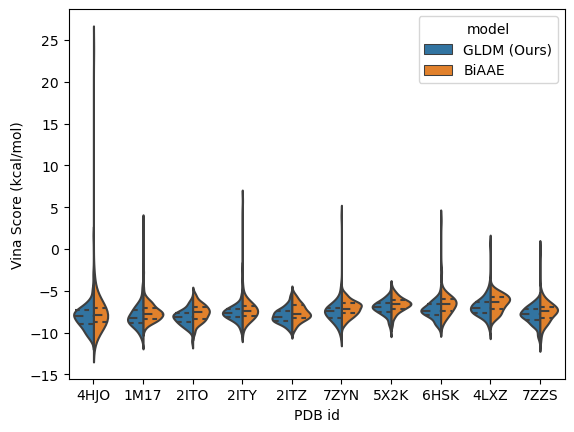

In [51]:
sns.violinplot(data=dfs2, x="PDB id", y="Vina Score (kcal/mol)", hue="model", split=True, gap=.1, inner="quart")

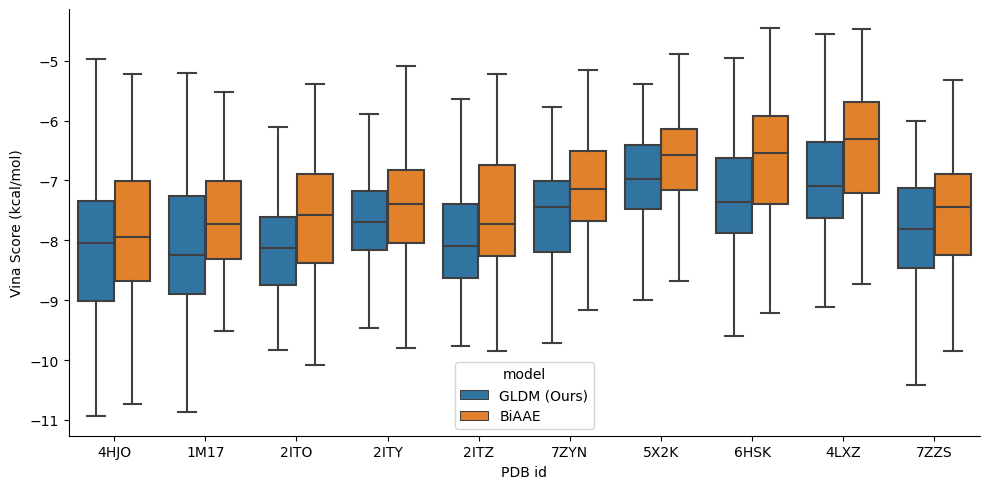

In [52]:
# fig, ax = plt.subplots(figsize=(12,6))
box_plot = sns.catplot(data=dfs2, x="PDB id", y="Vina Score (kcal/mol)", hue="model", kind="box", height=5, aspect=2, legend_out=False, showfliers=False)
# plt.title('')

In [53]:
box_plot.savefig('../plots/binding_affinity_wae.png')